In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# !pip install yfinance
import yfinance as yf
import datetime
# !pip3 install plotly
import plotly.graph_objs as go
import plotly.express as px
from sklearn.linear_model import LinearRegression
from pandas import datetime
import math
from math import sqrt
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation

C:\Users\nehal\AppData\Local\Temp/ipykernel_25048/1180545522.py:13: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


In [2]:
#https://www.fool.com/investing/stock-market/market-sectors/
#sectors = [energy, materials, industrials, utilities, healthcare, financials, consumer_discretionary, consumer_staples, information_technology, communication_services, real_estate]

data = yf.download("^GSPC AMZN XOM CVX SHW DD BA UNP DUK ED AEP UNH JNJ BRK-A JPM MCD KO PG AAPL MSFT FB GOOGL GOOG AMT SPG", start="2012-01-01", end="2022-02-18")
data = data["Adj Close"]
print(data)

[*********************100%***********************]  25 of 25 completed
                  AAPL        AEP         AMT         AMZN          BA  \
Date                                                                     
2012-01-03   12.575915  27.925901   49.124519   179.029999   60.731098   
2012-01-04   12.643500  28.014952   49.834518   177.509995   60.821091   
2012-01-05   12.783870  28.049189   50.410885   177.610001   60.166492   
2012-01-06   12.917506  27.939600   50.327354   182.610001   60.534710   
2012-01-09   12.897020  28.069752   50.469357   178.559998   60.984760   
...                ...        ...         ...          ...         ...   
2022-02-11  168.639999  87.650002  236.899994  3065.870117  212.300003   
2022-02-14  168.880005  86.180000  234.289993  3103.340088  210.039993   
2022-02-15  172.789993  85.440002  233.389999  3130.209961  217.729996   
2022-02-16  172.550003  85.410004  232.330002  3162.010010  218.929993   
2022-02-17  168.880005  85.489998  228.66

In [3]:
data = data.reset_index(level=None, drop=False, inplace=False)
data.head()

,Date,AAPL,AEP,AMT,AMZN,BA,BRK-A,CVX,DD,DUK,...,KO,MCD,MSFT,PG,SHW,SPG,UNH,UNP,XOM,^GSPC
0,2012-01-03,12.575915,27.925901,49.124519,179.029999,60.731098,116320.0,72.389854,31.980604,41.743439,...,25.638762,74.442368,21.623133,49.150494,27.431311,81.046112,44.067692,43.632107,56.468861,1277.060059
1,2012-01-04,12.643500,28.014952,49.834518,177.509995,60.821091,115210.0,72.265236,32.152370,41.550354,...,25.477921,74.856598,22.132010,49.128441,27.711657,79.642937,44.709572,43.947235,56.482002,1277.300049
2,2012-01-05,12.783870,28.049189,50.410885,177.610001,60.166492,115650.0,71.556862,32.356335,41.531040,...,25.357298,75.187965,22.358171,48.922501,27.925678,80.062637,45.009125,43.628075,56.311283,1281.060059
3,2012-01-06,12.917506,27.939600,50.327354,182.610001,60.534710,114500.0,71.038727,32.549580,41.531040,...,25.196463,75.767937,22.705502,48.804832,27.883484,79.442467,45.171738,43.442234,55.891056,1277.810059
4,2012-01-09,12.897020,28.069752,50.469357,178.559998,60.984760,114500.0,71.812675,32.538841,41.453819,...,25.196463,75.044868,22.406641,49.010761,28.100517,79.379845,45.120377,44.234077,56.140568,1280.699951


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2550 entries, 0 to 2549
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    2550 non-null   datetime64[ns]
 1   AAPL    2550 non-null   float64       
 2   AEP     2550 non-null   float64       
 3   AMT     2550 non-null   float64       
 4   AMZN    2550 non-null   float64       
 5   BA      2550 non-null   float64       
 6   BRK-A   2550 non-null   float64       
 7   CVX     2550 non-null   float64       
 8   DD      2550 non-null   float64       
 9   DUK     2550 non-null   float64       
 10  ED      2550 non-null   float64       
 11  FB      2455 non-null   float64       
 12  GOOG    2550 non-null   float64       
 13  GOOGL   2550 non-null   float64       
 14  JNJ     2550 non-null   float64       
 15  JPM     2550 non-null   float64       
 16  KO      2550 non-null   float64       
 17  MCD     2550 non-null   float64       
 18  MSFT    

In [5]:
data.describe()

,AAPL,AEP,AMT,AMZN,BA,BRK-A,CVX,DD,DUK,ED,...,KO,MCD,MSFT,PG,SHW,SPG,UNH,UNP,XOM,^GSPC
count,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,...,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000,2550.000000
mean,48.823132,57.035267,133.552112,1270.637874,182.715036,254196.510980,87.152990,62.662976,66.271158,59.706747,...,38.864083,133.131279,96.508484,84.031075,124.187653,122.496092,179.258496,116.450164,59.970804,2498.843849
std,41.490278,19.479836,70.302951,1067.156923,98.792830,85451.198977,13.982321,17.380838,16.850017,14.455041,...,8.637813,57.273035,82.495635,29.025730,75.399658,26.569604,116.075893,54.765918,8.650761,853.184017
min,12.119164,25.798319,49.124519,175.929993,55.668331,114500.000000,48.814342,27.563755,39.753582,37.830963,...,24.487320,64.752457,21.623133,44.310272,27.431311,39.909328,43.092014,42.639194,27.525692,1277.060059
25%,21.349956,40.711670,77.778873,335.062508,111.078194,191767.500000,77.983511,51.625217,51.987700,43.366243,...,31.981502,78.615742,36.358570,63.767957,64.064768,103.443636,73.056025,73.576305,57.781515,1918.379974
50%,30.101226,55.928267,104.100887,835.475006,141.152939,245825.000000,84.887142,62.772203,64.367538,63.441351,...,37.169977,111.411755,58.979395,73.039379,97.218098,128.776993,150.115334,97.928211,61.502810,2279.810059
75%,53.446771,76.284969,200.923462,1854.802460,245.385830,310494.000000,98.419090,76.081993,78.434544,71.248096,...,44.767420,181.836891,133.297340,107.511150,154.732723,141.440426,250.147423,158.079655,65.335205,2907.322449
max,181.778397,97.346497,300.716858,3731.409912,430.299988,485379.000000,137.367767,101.112877,105.711639,87.266922,...,62.119999,269.690002,342.402008,164.139999,352.160004,173.535248,505.579987,254.779999,81.486641,4796.560059


In [6]:
# !pip install missingno
import missingno as msno
data.isna().sum()

Date      0
AAPL      0
AEP       0
AMT       0
AMZN      0
BA        0
BRK-A     0
CVX       0
DD        0
DUK       0
ED        0
FB       95
GOOG      0
GOOGL     0
JNJ       0
JPM       0
KO        0
MCD       0
MSFT      0
PG        0
SHW       0
SPG       0
UNH       0
UNP       0
XOM       0
^GSPC     0
dtype: int64

<AxesSubplot:>

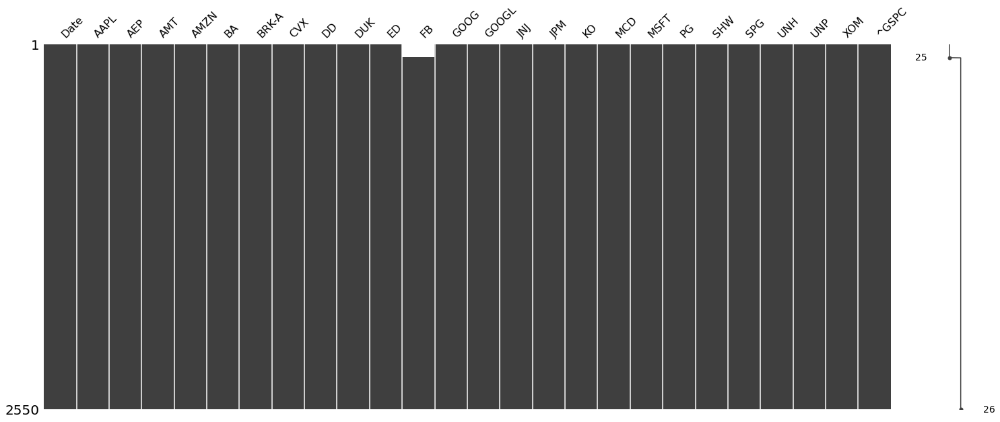

In [7]:
msno.matrix(data)

8097.823079025326


<AxesSubplot:xlabel='FB', ylabel='Count'>

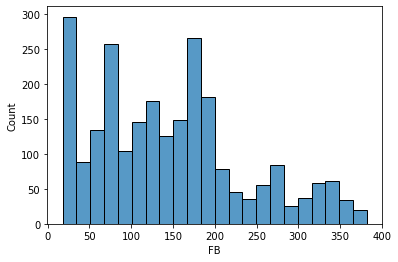

In [8]:
print(data['FB'].var())
sns.histplot(data['FB'])
#data is skewed, so I don't want to use mean value for the imputation. 
#KNN imputation will not work because of the non-gausian distribution. 
#Can not replace by mode because the highest frequency value is not near the mean value.
#So using median for imputation.

AxesSubplot(0.125,0.125;0.775x0.755)


C:\Users\nehal\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


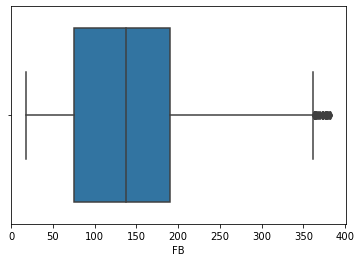

In [9]:
# Box plot
print(sns.boxplot(data['FB']))

AxesSubplot(0.125,0.125;0.775x0.755)


C:\Users\nehal\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


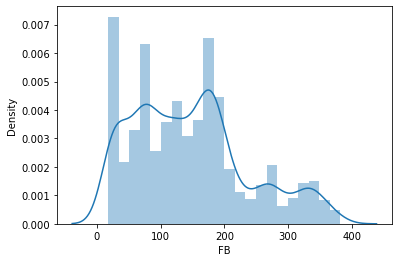

In [10]:
# Distribution plot
print(sns.distplot(data['FB']))

In [11]:
data = data.fillna(data['FB'].median())

In [12]:
data.isna().sum()

Date     0
AAPL     0
AEP      0
AMT      0
AMZN     0
BA       0
BRK-A    0
CVX      0
DD       0
DUK      0
ED       0
FB       0
GOOG     0
GOOGL    0
JNJ      0
JPM      0
KO       0
MCD      0
MSFT     0
PG       0
SHW      0
SPG      0
UNH      0
UNP      0
XOM      0
^GSPC    0
dtype: int64

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>], dtype=object)

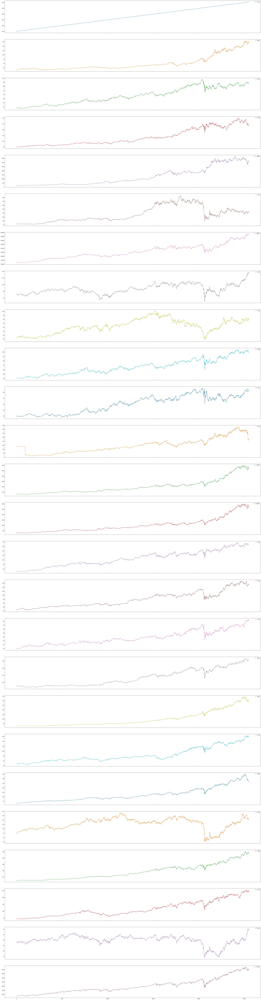

In [13]:
data.plot(kind="line", figsize=(50,200), subplots = True)

In [14]:
data.columns
data['Date']

0      2012-01-03
1      2012-01-04
2      2012-01-05
3      2012-01-06
4      2012-01-09
          ...    
2545   2022-02-11
2546   2022-02-14
2547   2022-02-15
2548   2022-02-16
2549   2022-02-17
Name: Date, Length: 2550, dtype: datetime64[ns]

In [15]:
data2 = data.drop(['Date'], axis = 1)
log_returns = np.log(data2/data2.shift())
log_returns

,AAPL,AEP,AMT,AMZN,BA,BRK-A,CVX,DD,DUK,ED,...,KO,MCD,MSFT,PG,SHW,SPG,UNH,UNP,XOM,^GSPC
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.005360,0.003184,0.014350,-0.008526,0.001481,-0.009588,-0.001723,0.005357,-0.004636,-0.012443,...,-0.006293,0.005549,0.023261,-0.000449,0.010168,-0.017465,0.014461,0.007196,0.000233,0.000188
2,0.011041,0.001221,0.011499,0.000563,-0.010821,0.003812,-0.009851,0.006324,-0.000465,-0.002674,...,-0.004746,0.004417,0.010167,-0.004201,0.007693,0.005256,0.006678,-0.007289,-0.003027,0.002939
3,0.010399,-0.003915,-0.001658,0.027763,0.006101,-0.009994,-0.007267,0.005955,0.000000,-0.010771,...,-0.006363,0.007684,0.015415,-0.002408,-0.001512,-0.007776,0.003606,-0.004269,-0.007491,-0.002540
4,-0.001587,0.004648,0.002818,-0.022428,0.007407,0.000000,0.010836,-0.000330,-0.001861,0.002873,...,0.000000,-0.009589,-0.013250,0.004211,0.007753,-0.000789,-0.001138,0.018063,0.004454,0.002259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2545,-0.020426,0.002971,-0.023405,-0.036572,-0.029929,-0.001532,0.020157,-0.013157,-0.000401,0.002733,...,-0.017918,-0.006679,-0.024574,-0.005615,-0.024701,-0.015045,-0.017806,-0.013765,0.024867,-0.019152
2546,0.001422,-0.016913,-0.011078,0.012148,-0.010702,-0.014625,-0.015537,0.000504,0.002003,-0.014826,...,0.006448,-0.006961,-0.000136,0.002875,-0.009640,-0.013701,-0.007832,0.015540,-0.015453,-0.003848
2547,0.022889,-0.008624,-0.003849,0.008621,0.035958,0.003318,-0.007347,0.029196,-0.006524,-0.010636,...,0.003783,0.001656,0.018373,0.000510,0.004022,0.010099,0.008041,0.027529,-0.012614,0.015644
2548,-0.001390,-0.000351,-0.004552,0.010108,0.005496,0.000978,0.000298,0.005495,0.002113,-0.003447,...,-0.000164,-0.002841,-0.001168,0.007560,0.003896,0.017814,0.003798,0.017849,0.004605,0.000881


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

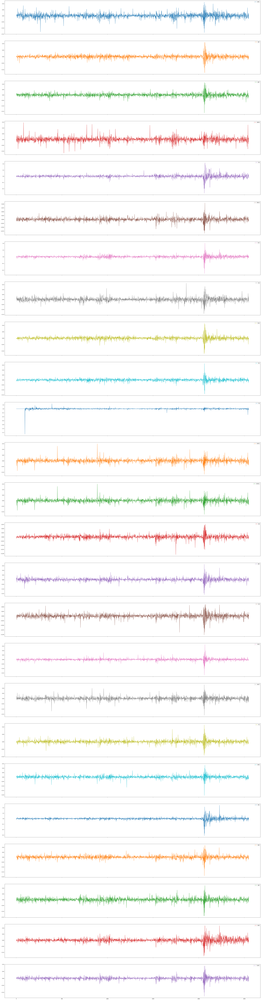

In [16]:
log_returns.plot(kind="line", figsize=(50,200), subplots = True)

In [17]:
daily_percentage_change = data2.pct_change()
daily_percentage_change

,AAPL,AEP,AMT,AMZN,BA,BRK-A,CVX,DD,DUK,ED,...,KO,MCD,MSFT,PG,SHW,SPG,UNH,UNP,XOM,^GSPC
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.005374,0.003189,0.014453,-0.008490,0.001482,-0.009543,-0.001721,0.005371,-0.004626,-0.012366,...,-0.006273,0.005564,0.023534,-0.000449,0.010220,-0.017313,0.014566,0.007222,0.000233,0.000188
2,0.011102,0.001222,0.011566,0.000563,-0.010763,0.003819,-0.009802,0.006344,-0.000465,-0.002671,...,-0.004734,0.004427,0.010219,-0.004192,0.007723,0.005270,0.006700,-0.007262,-0.003023,0.002944
3,0.010454,-0.003907,-0.001657,0.028152,0.006120,-0.009944,-0.007241,0.005972,0.000000,-0.010714,...,-0.006343,0.007714,0.015535,-0.002405,-0.001511,-0.007746,0.003613,-0.004260,-0.007463,-0.002537
4,-0.001586,0.004658,0.002822,-0.022178,0.007435,0.000000,0.010895,-0.000330,-0.001859,0.002877,...,0.000000,-0.009543,-0.013162,0.004219,0.007784,-0.000788,-0.001137,0.018228,0.004464,0.002262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2545,-0.020218,0.002975,-0.023133,-0.035911,-0.029486,-0.001531,0.020362,-0.013071,-0.000401,0.002737,...,-0.017758,-0.006657,-0.024274,-0.005599,-0.024399,-0.014933,-0.017649,-0.013671,0.025179,-0.018969
2546,0.001423,-0.016771,-0.011017,0.012222,-0.010645,-0.014519,-0.015417,0.000505,0.002005,-0.014716,...,0.006469,-0.006937,-0.000136,0.002879,-0.009594,-0.013608,-0.007801,0.015661,-0.015335,-0.003841
2547,0.023152,-0.008587,-0.003841,0.008658,0.036612,0.003323,-0.007320,0.029627,-0.006503,-0.010580,...,0.003790,0.001658,0.018542,0.000510,0.004030,0.010150,0.008073,0.027912,-0.012535,0.015767
2548,-0.001389,-0.000351,-0.004542,0.010159,0.005511,0.000979,0.000298,0.005510,0.002115,-0.003441,...,-0.000164,-0.002837,-0.001167,0.007588,0.003903,0.017973,0.003806,0.018009,0.004616,0.000881


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

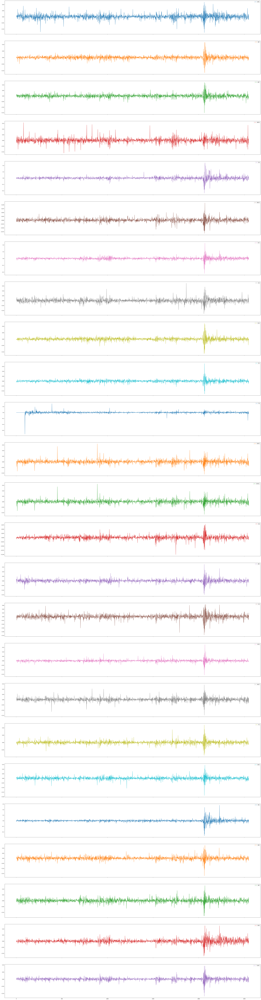

In [18]:
daily_percentage_change.plot(kind="line", figsize=(50,200), subplots = True)

In [19]:
cov = log_returns.cov()

In [20]:
var = log_returns['^GSPC'].var()
var

0.00010763106197363606

In [21]:
#beta value of apple stock. If general market goes up 10%, apple is expected to go up by 11.4% 
cov.loc['AAPL', '^GSPC']/var

1.1471829507856595

In [22]:
#beta value of all. SP500 is beta=1
beta_values = cov.loc['^GSPC']/var
beta_values

AAPL     1.147183
AEP      0.519212
AMT      0.800178
AMZN     1.022374
BA       1.402235
BRK-A    0.831963
CVX      1.130472
DD       1.183178
DUK      0.577036
ED       0.451998
FB       1.132834
GOOG     1.067832
GOOGL    1.071051
JNJ      0.649167
JPM      1.207380
KO       0.656061
MCD      0.739878
MSFT     1.169356
PG       0.598160
SHW      0.934550
SPG      1.109183
UNH      0.976750
UNP      1.046951
XOM      0.979055
^GSPC    1.000000
Name: ^GSPC, dtype: float64

In [23]:
#cross-checking beta value of apple using linear regression
X = log_returns['^GSPC'].iloc[1:].to_numpy().reshape(-1,1)
Y = log_returns['AAPL'].iloc[1:].to_numpy().reshape(-1,1)

lin_regr = LinearRegression()
lin_regr.fit(X,Y)

lin_regr.coef_[0,0]

#got same value by different method. That proves other Beta values were true

1.1471829507856603

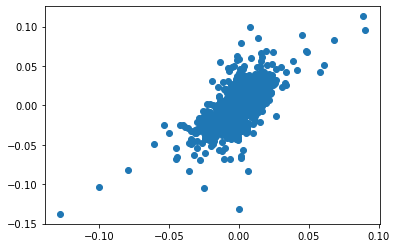

In [24]:
fig, ax = plt.subplots()
ax.scatter(X,Y)

In [25]:
#Measure of dispersion
#Historical vs. implied volatility
standard_deviation_stocks = dict(data2.std())
standard_deviation_stocks

{'AAPL': 41.4902776881904,
 'AEP': 19.479835883871274,
 'AMT': 70.30295130892523,
 'AMZN': 1067.1569233232447,
 'BA': 98.79283033812031,
 'BRK-A': 85451.19897671613,
 'CVX': 13.982320856890365,
 'DD': 17.38083772701458,
 'DUK': 16.850017371891482,
 'ED': 14.455041355293693,
 'FB': 88.31020282496243,
 'GOOG': 655.8048898706394,
 'GOOGL': 646.9649810874679,
 'JNJ': 33.8165432513485,
 'JPM': 37.846041025664704,
 'KO': 8.637812679260836,
 'MCD': 57.27303476536372,
 'MSFT': 82.49563509895418,
 'PG': 29.025730244651875,
 'SHW': 75.39965832188571,
 'SPG': 26.569604207757894,
 'UNH': 116.07589271463418,
 'UNP': 54.76591750244349,
 'XOM': 8.65076050811443,
 '^GSPC': 853.184016916147}

In [26]:
sorted_acc_to_std = dict(sorted(standard_deviation_stocks.items(), key=lambda x: x[1]))

sorted_acc_to_std

{'KO': 8.637812679260836,
 'XOM': 8.65076050811443,
 'CVX': 13.982320856890365,
 'ED': 14.455041355293693,
 'DUK': 16.850017371891482,
 'DD': 17.38083772701458,
 'AEP': 19.479835883871274,
 'SPG': 26.569604207757894,
 'PG': 29.025730244651875,
 'JNJ': 33.8165432513485,
 'JPM': 37.846041025664704,
 'AAPL': 41.4902776881904,
 'UNP': 54.76591750244349,
 'MCD': 57.27303476536372,
 'AMT': 70.30295130892523,
 'SHW': 75.39965832188571,
 'MSFT': 82.49563509895418,
 'FB': 88.31020282496243,
 'BA': 98.79283033812031,
 'UNH': 116.07589271463418,
 'GOOGL': 646.9649810874679,
 'GOOG': 655.8048898706394,
 '^GSPC': 853.184016916147,
 'AMZN': 1067.1569233232447,
 'BRK-A': 85451.19897671613}

In [27]:
sorted_list_std = list(sorted_acc_to_std.keys())
sorted_acc_to_std = list(sorted_acc_to_std)
sorted_list_std_low = sorted_acc_to_std[0:9]
sorted_acc_to_std_medium = sorted_acc_to_std[10:17]
sorted_acc_to_std_high = sorted_acc_to_std[18:26]

In [29]:
risk_level = int(input("What risk level would you prefer for your investment?  \n 1 = low,\n 2 = medium,\n 3 = high: \n \n"))

What risk level would you prefer for your investment?  
 1 = low,
 2 = medium,
 3 = high: 
 
3


In [30]:
def stocks_for_correlation(risk_level):
    if risk_level == 1:
        print("Best low risk stocks are:", sorted_list_std_low)
        return sorted_list_std_low
    elif risk_level == 2:
        print("Best medium risk stocks are:", sorted_acc_to_std_medium)
        return sorted_acc_to_std_medium
    elif risk_level == 3:
       print("Best high risk stocks are:", sorted_acc_to_std_high)
       return sorted_acc_to_std_high
    else:
        print("invalid input. please enter 0,1,2")

In [31]:
stocks_for_correlation(risk_level)

Best high risk stocks are: ['BA', 'UNH', 'GOOGL', 'GOOG', '^GSPC', 'AMZN', 'BRK-A']


['BA', 'UNH', 'GOOGL', 'GOOG', '^GSPC', 'AMZN', 'BRK-A']

In [32]:
diversification = data[stocks_for_correlation(risk_level)]

Best high risk stocks are: ['BA', 'UNH', 'GOOGL', 'GOOG', '^GSPC', 'AMZN', 'BRK-A']


In [33]:
diversification

,BA,UNH,GOOGL,GOOG,^GSPC,AMZN,BRK-A
0,60.731098,44.067692,333.038025,331.462585,1277.060059,179.029999,116320.0
1,60.821091,44.709572,334.474487,332.892242,1277.300049,177.509995,115210.0
2,60.166492,45.009125,329.834839,328.274536,1281.060059,177.610001,115650.0
3,60.534710,45.171738,325.335327,323.796326,1277.810059,182.610001,114500.0
4,60.984760,45.120377,311.541534,310.067780,1280.699951,178.559998,114500.0
...,...,...,...,...,...,...,...
2545,212.300003,478.130005,2685.649902,2682.600098,4418.640137,3065.870117,479370.0
2546,210.039993,474.399994,2710.520020,2706.000000,4401.669922,3103.340088,472410.0
2547,217.729996,478.230011,2732.169922,2728.510010,4471.069824,3130.209961,473980.0
2548,218.929993,480.049988,2754.760010,2749.750000,4475.009766,3162.010010,474444.0


In [34]:
diversification.corr()

,BA,UNH,GOOGL,GOOG,^GSPC,AMZN,BRK-A
BA,1.000000,0.641526,0.514182,0.510876,0.611253,0.574844,0.719978
UNH,0.641526,1.000000,0.967526,0.966534,0.983869,0.968420,0.969109
GOOGL,0.514182,0.967526,1.000000,0.999790,0.981923,0.940662,0.940875
GOOG,0.510876,0.966534,0.999790,1.000000,0.981148,0.941616,0.939083
^GSPC,0.611253,0.983869,0.981923,0.981148,1.000000,0.956895,0.977010
AMZN,0.574844,0.968420,0.940662,0.941616,0.956895,1.000000,0.910884
BRK-A,0.719978,0.969109,0.940875,0.939083,0.977010,0.910884,1.000000


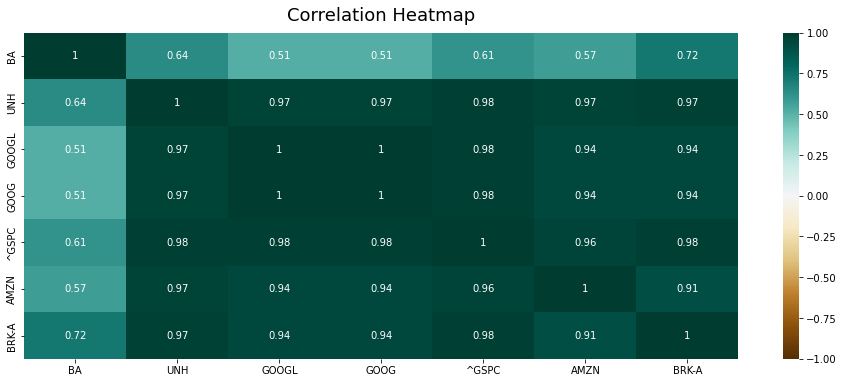

In [35]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(diversification.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

In [36]:
c = diversification.corr()
s = c.unstack()
sort_by_corr = s.sort_values(kind="quicksort")
sort_by_corr

GOOG   BA       0.510876
BA     GOOG     0.510876
       GOOGL    0.514182
GOOGL  BA       0.514182
BA     AMZN     0.574844
AMZN   BA       0.574844
BA     ^GSPC    0.611253
^GSPC  BA       0.611253
BA     UNH      0.641526
UNH    BA       0.641526
BRK-A  BA       0.719978
BA     BRK-A    0.719978
BRK-A  AMZN     0.910884
AMZN   BRK-A    0.910884
GOOG   BRK-A    0.939083
BRK-A  GOOG     0.939083
GOOGL  AMZN     0.940662
AMZN   GOOGL    0.940662
GOOGL  BRK-A    0.940875
BRK-A  GOOGL    0.940875
GOOG   AMZN     0.941616
AMZN   GOOG     0.941616
       ^GSPC    0.956895
^GSPC  AMZN     0.956895
GOOG   UNH      0.966534
UNH    GOOG     0.966534
GOOGL  UNH      0.967526
UNH    GOOGL    0.967526
AMZN   UNH      0.968420
UNH    AMZN     0.968420
       BRK-A    0.969109
BRK-A  UNH      0.969109
       ^GSPC    0.977010
^GSPC  BRK-A    0.977010
       GOOG     0.981148
GOOG   ^GSPC    0.981148
^GSPC  GOOGL    0.981923
GOOGL  ^GSPC    0.981923
UNH    ^GSPC    0.983869
^GSPC  UNH      0.983869


In [37]:
dict_sorted_corr = dict(sort_by_corr)
dict_sorted_corr

{('GOOG', 'BA'): 0.5108757676635639,
 ('BA', 'GOOG'): 0.5108757676635639,
 ('BA', 'GOOGL'): 0.5141822484194547,
 ('GOOGL', 'BA'): 0.5141822484194547,
 ('BA', 'AMZN'): 0.5748443885707926,
 ('AMZN', 'BA'): 0.5748443885707926,
 ('BA', '^GSPC'): 0.6112529201526755,
 ('^GSPC', 'BA'): 0.6112529201526755,
 ('BA', 'UNH'): 0.6415262427442685,
 ('UNH', 'BA'): 0.6415262427442685,
 ('BRK-A', 'BA'): 0.7199779604261795,
 ('BA', 'BRK-A'): 0.7199779604261795,
 ('BRK-A', 'AMZN'): 0.9108836041070401,
 ('AMZN', 'BRK-A'): 0.9108836041070401,
 ('GOOG', 'BRK-A'): 0.9390834524355152,
 ('BRK-A', 'GOOG'): 0.9390834524355152,
 ('GOOGL', 'AMZN'): 0.9406617366967953,
 ('AMZN', 'GOOGL'): 0.9406617366967953,
 ('GOOGL', 'BRK-A'): 0.9408753866171841,
 ('BRK-A', 'GOOGL'): 0.9408753866171841,
 ('GOOG', 'AMZN'): 0.9416158630205856,
 ('AMZN', 'GOOG'): 0.9416158630205856,
 ('AMZN', '^GSPC'): 0.9568953994862428,
 ('^GSPC', 'AMZN'): 0.9568953994862428,
 ('GOOG', 'UNH'): 0.9665343382981517,
 ('UNH', 'GOOG'): 0.96653433829815

In [38]:
non_corr_stocks = list(dict_sorted_corr.keys())[0:3]
non_corr_stocks

[('GOOG', 'BA'), ('BA', 'GOOG'), ('BA', 'GOOGL')]

In [39]:
#list of tuples to plain list
o = [item for t in non_corr_stocks for item in t]
o

['GOOG', 'BA', 'BA', 'GOOG', 'BA', 'GOOGL']

In [40]:
#creating set to get 3 distinct keys
tuple_non_corr_stocks = set(o)
tuple_non_corr_stocks

{'BA', 'GOOG', 'GOOGL'}

In [41]:
stocks_to_invest = list(tuple_non_corr_stocks)
stocks_to_invest

['BA', 'GOOGL', 'GOOG']

In [42]:
data['^GSPC']

0       1277.060059
1       1277.300049
2       1281.060059
3       1277.810059
4       1280.699951
           ...     
2545    4418.640137
2546    4401.669922
2547    4471.069824
2548    4475.009766
2549    4380.259766
Name: ^GSPC, Length: 2550, dtype: float64

In [43]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))

In [44]:
scaled_df = scaler.fit_transform(np.array(data['^GSPC']).reshape(-1, 1))

In [45]:
print(scaled_df)

[[0.00000000e+00]
 [6.81887298e-05]
 [1.13652507e-03]
 ...
 [9.07518047e-01]
 [9.08637507e-01]
 [8.81716070e-01]]


In [46]:
# Train-Test splitting
# For linear regression or classification problem we can use Cross validation and random seed
# But for Time series data we need to devide in different way.
# Because next data always dependent to previous data.

In [67]:
# splitting data into training and testing 
# 80% for model training and 20% for model testing

training_data = pd.DataFrame(scaled_df [0 : int(len(data)*0.80)])
testing_data = pd.DataFrame(scaled_df [int(len(data)*0.80) : int(len(data))])

In [68]:
training_data.shape, testing_data.shape

((2040, 1), (510, 1))

In [69]:
np.array(training_data)

array([[0.00000000e+00],
       [6.81887298e-05],
       [1.13652507e-03],
       ...,
       [5.82653758e-01],
       [5.89580915e-01],
       [5.91189073e-01]])

In [70]:
def createDataSet(data, time_stamp):
    data = np.array(data)
    x_train = []
    y_train = []
    for i in range(len(data) - time_stamp -1):
        lst = data[i : (i + time_stamp), 0]
        x_train.append(lst)
        y_train.append(data[i + time_stamp, 0])
    return np.array(x_train), np.array(y_train)

In [71]:
time_stamp = 100
x_train, y_train = createDataSet(training_data, time_stamp)
x_test, y_test = createDataSet(testing_data, time_stamp)

In [77]:
print(x_train)

[[0.00000000e+00 6.81887298e-05 1.13652507e-03 ... 1.12430590e-02
  1.18766662e-02 1.23938046e-02]
 [6.81887298e-05 1.13652507e-03 2.13098451e-04 ... 1.18766662e-02
  1.23938046e-02 1.15811586e-02]
 [1.13652507e-03 2.13098451e-04 1.03420730e-03 ... 1.23938046e-02
  1.15811586e-02 1.57295029e-02]
 ...
 [4.91640811e-01 4.88961472e-01 4.91160646e-01 ... 5.60267045e-01
  5.74095761e-01 5.84636989e-01]
 [4.88961472e-01 4.91160646e-01 4.91453309e-01 ... 5.74095761e-01
  5.84636989e-01 5.87788030e-01]
 [4.91160646e-01 4.91453309e-01 4.91470374e-01 ... 5.84636989e-01
  5.87788030e-01 5.82653758e-01]]


In [78]:
print(x_train[0].shape)

(100,)


In [81]:
x_train.shape, y_train.shape

((1939, 100, 1), (1939,))

In [83]:
# We need to reshape input in 3rd [samples, time stemps, features] which is important for LSTM
x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], 1)
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], 1)

In [84]:
from keras.layers import Dense, Dropout, LSTM
from keras.models import Sequential

In [117]:
x_train.shape[1]

100

In [118]:
model = Sequential()

model.add(LSTM(units = 50, activation = 'relu', return_sequences=True,
               input_shape = (x_train.shape[1], 1)))
# model.add(Dropout(0.2)) # randomly sets input units to 0 with a frequency of rate at each step during training time, which helps prevent overfitting

model.add(LSTM(units = 60, activation = 'relu', return_sequences=True))
# model.add(Dropout(0.3))

model.add(LSTM(units = 60, activation = 'relu', return_sequences=True))
# model.add(Dropout(0.4))

model.add(LSTM(units = 60, activation = 'relu'))
# model.add(Dropout(0.5))

model.add(Dense(units = 1))

In [119]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 100, 50)           10400     
                                                                 
 lstm_5 (LSTM)               (None, 100, 60)           26640     
                                                                 
 lstm_6 (LSTM)               (None, 100, 60)           29040     
                                                                 
 lstm_7 (LSTM)               (None, 60)                29040     
                                                                 
 dense_1 (Dense)             (None, 1)                 61        
                                                                 
Total params: 95,181
Trainable params: 95,181
Non-trainable params: 0
_________________________________________________________________


In [135]:
model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse'])
model.fit(x_train, y_train, validation_data = (x_test, y_test), 
          epochs = 100, shuffle = True, verbose = 1, batch_size = 64)

Epoch 1/100
31/31 [==============================] - 6s 138ms/step - loss: 3.6337e-04 - mse: 3.6337e-04 - val_loss: 3.6905e-04 - val_mse: 3.6905e-04
Epoch 2/100
31/31 [==============================] - 4s 131ms/step - loss: 3.8659e-05 - mse: 3.8659e-05 - val_loss: 2.2445e-04 - val_mse: 2.2445e-04
Epoch 3/100
31/31 [==============================] - 4s 129ms/step - loss: 3.2461e-05 - mse: 3.2461e-05 - val_loss: 5.2010e-04 - val_mse: 5.2010e-04
Epoch 4/100
31/31 [==============================] - 4s 129ms/step - loss: 2.9471e-05 - mse: 2.9471e-05 - val_loss: 2.1711e-04 - val_mse: 2.1711e-04
Epoch 5/100
31/31 [==============================] - 4s 129ms/step - loss: 3.0981e-05 - mse: 3.0981e-05 - val_loss: 3.7641e-04 - val_mse: 3.7641e-04
Epoch 6/100
31/31 [==============================] - 4s 134ms/step - loss: 2.9083e-05 - mse: 2.9083e-05 - val_loss: 3.1319e-04 - val_mse: 3.1319e-04
Epoch 7/100
31/31 [==============================] - 4s 126ms/step - loss: 2.8335e-05 - mse: 2.8335e-05 - 

Epoch 56/100
31/31 [==============================] - 4s 127ms/step - loss: 3.6023e-05 - mse: 3.6023e-05 - val_loss: 2.7346e-04 - val_mse: 2.7346e-04
Epoch 57/100
31/31 [==============================] - 4s 126ms/step - loss: 3.4179e-05 - mse: 3.4179e-05 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 58/100
31/31 [==============================] - 4s 127ms/step - loss: 4.5371e-05 - mse: 4.5371e-05 - val_loss: 2.6465e-04 - val_mse: 2.6465e-04
Epoch 59/100
31/31 [==============================] - 4s 126ms/step - loss: 3.9933e-05 - mse: 3.9933e-05 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 60/100
31/31 [==============================] - 4s 126ms/step - loss: 3.1211e-05 - mse: 3.1211e-05 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 61/100
31/31 [==============================] - 4s 126ms/step - loss: 3.2723e-05 - mse: 3.2723e-05 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 62/100
31/31 [==============================] - 4s 126ms/step - loss: 3.2208e-05 - mse: 3.2208e-05 - val_loss: 4.6847e-04 - va

In [136]:
# model.save('financial_ad_model.h5')

In [139]:
train_predict = model.predict(x_train)
test_predict = model.predict(x_test)

In [140]:
model

In [141]:
train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)

In [142]:
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(y_train, train_predict))

2269.7662350393443

In [143]:
math.sqrt(mean_squared_error(y_test, test_predict))

4145.900354914507

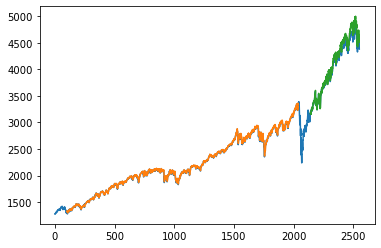

In [144]:
import numpy
# comparing train and test result with original data by plotting all in single graph
### Plotting 
trainPredictPlot = numpy.empty_like(scaled_df)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[time_stamp:len(train_predict)+time_stamp, :] = train_predict

# shift test predictions for plotting
testPredictPlot = numpy.empty_like(scaled_df)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(train_predict)+(time_stamp*2)+1:len(scaled_df)-1, :] = test_predict

# plot baseline and predictions
plt.plot(scaler.inverse_transform(scaled_df))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

# Orange line = Train Predicted data
# Blue line = Main Data
# Green line = Test Predicated data